# MANUAL NET ARCHITECTURE

In [19]:
import warnings
warnings.filterwarnings('ignore')

In [20]:
import os
import glob
import numpy as np
import scipy

from tensorflow.keras.preprocessing.image import ImageDataGenerator

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from PIL import Image

from tensorflow.keras.layers import Convolution2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Activation

from keras.callbacks import ModelCheckpoint
import matplotlib.pyplot as plt

In [21]:
AH = 'dataset/train/Aloevera_healthy'
AR = 'dataset/train/Aloevera_rot'
ARUST = 'dataset/train/Aloevera_rust'
BH = 'dataset/train/Basil_healthy'
CA = 'dataset/train/citrus_affected'
MDA = 'dataset/train/Mentha_Dried_affected'


In [22]:
def plot_images(item_dir, n=6):
    all_item_dir = os.listdir(item_dir)
    item_files = [os.path.join(item_dir, file) for file in all_item_dir][:n]
    
    plt.figure(figsize=(80, 40))
    for idx, img_path in enumerate(item_files):
        plt.subplot(3, n, idx+1)
        img = plt.imread(img_path)
        plt.imshow(img, cmap='gray')
        plt.axis('off')
    
    plt.tight_layout()
    
def image_details_print(data,path):
    print('======== Images in: ', path)
    for key,values in data.items():
        print(key,':\t', values)


def images_details(path):
    files=[f for f in glob.glob(path + "**/*.*", recursive=True)]
    data={}
    data['Images_count']=len(files)
    data['Min_width']=10**100
    data['Max_width']=0
    data['Min_height']=10**100
    data['Max_height']=0
    
    for f in files:
        img=Image.open(f)
        width,height=img.size
        data['Min_width']=min(width,data['Min_width'])
        data['Max_width']=max(width, data['Max_width'])
        data['Min_height']=min(height, data['Min_height'])
        data['Max_height']=max(height, data['Max_height'])
        
    image_details_print(data,path)


TRAINING DATA FOR ALOEVERA HEALTHY:

======== Images in:  dataset/train/Aloevera_healthy
Images_count :	 125
Min_width :	 128
Max_width :	 1297
Min_height :	 128
Max_height :	 1217



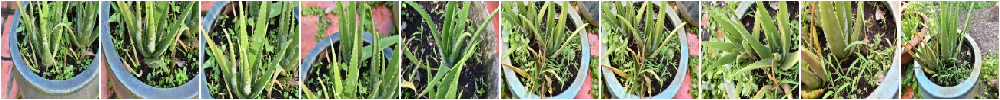

In [23]:
print("")
print("TRAINING DATA FOR ALOEVERA HEALTHY:")
print("")
images_details(AH)
print("")
plot_images(AH, 10) 


TRAINING DATA FOR ALOEVERA ROT:

======== Images in:  dataset/train/Aloevera_rot
Images_count :	 125
Min_width :	 104
Max_width :	 256
Min_height :	 137
Max_height :	 256



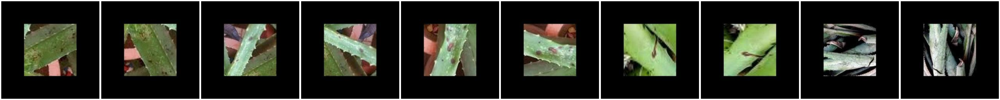

In [24]:
print("")
print("TRAINING DATA FOR ALOEVERA ROT:")
print("")
images_details(AR)
print("")
plot_images(AR, 10)


TRAINING DATA FOR ALOEVERA RUST:

======== Images in:  dataset/train/Aloevera_rust
Images_count :	 125
Min_width :	 256
Max_width :	 256
Min_height :	 256
Max_height :	 256



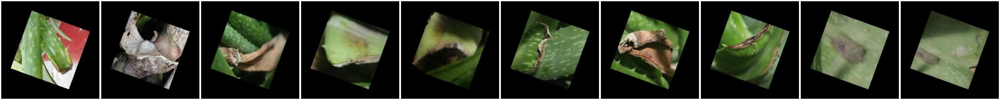

In [25]:
print("")
print("TRAINING DATA FOR ALOEVERA RUST:")
print("")
images_details(ARUST)
print("")
plot_images(ARUST, 10)


TRAINING DATA FOR BASIL HEALTHY:

======== Images in:  dataset/train/Basil_healthy
Images_count :	 125
Min_width :	 236
Max_width :	 1600
Min_height :	 284
Max_height :	 1200



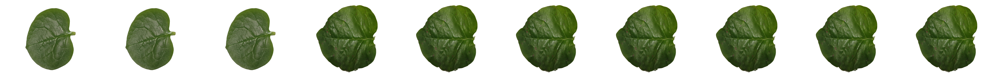

In [26]:
print("")
print("TRAINING DATA FOR BASIL HEALTHY:")
print("")
images_details(BH)
print("")
plot_images(BH, 10)


TRAINING DATA FOR CITRUS AFFECTED:

======== Images in:  dataset/train/citrus_affected
Images_count :	 125
Min_width :	 1000
Max_width :	 1000
Min_height :	 1000
Max_height :	 1000



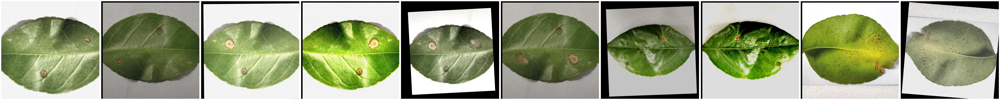

In [27]:
print("")
print("TRAINING DATA FOR CITRUS AFFECTED:")
print("")
images_details(CA)
print("")
plot_images(CA, 10)


TRAINING DATA FOR MENTHA DRIED AFFECTED:

======== Images in:  dataset/train/Mentha_Dried_affected
Images_count :	 125
Min_width :	 1280
Max_width :	 1280
Min_height :	 768
Max_height :	 768



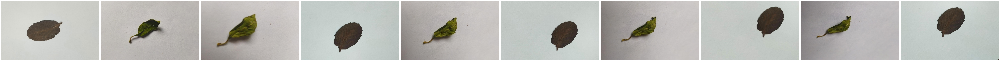

In [28]:
print("")
print("TRAINING DATA FOR MENTHA DRIED AFFECTED:")
print("")
images_details(MDA)
print("")
plot_images(MDA, 10)

In [29]:
train_datagen=ImageDataGenerator(rescale=1./255,shear_range=0.2,zoom_range=0.2,horizontal_flip=True)
training_set=train_datagen.flow_from_directory('dataset/train',target_size=(224,224),batch_size=32,class_mode='categorical')

Found 2000 images belonging to 16 classes.


In [30]:
test_datagen=ImageDataGenerator(rescale=1./255)
test_set=test_datagen.flow_from_directory('dataset/test',target_size=(224,224),batch_size=32,class_mode='categorical')

Found 2000 images belonging to 16 classes.


In [31]:
Classifier=Sequential()
Classifier.add(Convolution2D(32,(3,3),input_shape=(224,224,3),activation='relu'))
Classifier.add(MaxPooling2D(pool_size=(2,2)))
Classifier.add(Flatten())
Classifier.add(Dense(38, activation='relu'))
Classifier.add(Dense(16, activation='softmax'))
Classifier.compile(optimizer='rmsprop',loss='categorical_crossentropy',metrics=['accuracy'])

In [32]:
model_path = "MANUAL.h5"

callbacks = [
    ModelCheckpoint(model_path, monitor='accuracy', verbose=1, save_best_only=True)
]

In [33]:
epochs = 10
batch_size = 512

In [34]:
#### Fitting the model


history = Classifier.fit(
           training_set, steps_per_epoch=training_set.samples // batch_size, 
           epochs=epochs, 
           validation_data=test_set,validation_steps=test_set.samples // batch_size,
           callbacks=callbacks)

Epoch 1/10
3/3 [==============================] - ETA: 0s - loss: 42.4266 - accuracy: 0.0729
Epoch 1: accuracy improved from -inf to 0.07292, saving model to MANUAL.h5
3/3 [==============================] - 6s 2s/step - loss: 42.4266 - accuracy: 0.0729 - val_loss: 12.0124 - val_accuracy: 0.1771
Epoch 2/10
3/3 [==============================] - ETA: 0s - loss: 11.4528 - accuracy: 0.1250
Epoch 2: accuracy improved from 0.07292 to 0.12500, saving model to MANUAL.h5
3/3 [==============================] - 5s 2s/step - loss: 11.4528 - accuracy: 0.1250 - val_loss: 6.4055 - val_accuracy: 0.0938
Epoch 3/10
3/3 [==============================] - ETA: 0s - loss: 3.8184 - accuracy: 0.0625
Epoch 3: accuracy did not improve from 0.12500
3/3 [==============================] - 4s 2s/step - loss: 3.8184 - accuracy: 0.0625 - val_loss: 2.4074 - val_accuracy: 0.1458
Epoch 4/10
3/3 [==============================] - ETA: 0s - loss: 2.8210 - accuracy: 0.0417
Epoch 4: accuracy did not improve from 0.12500
3/

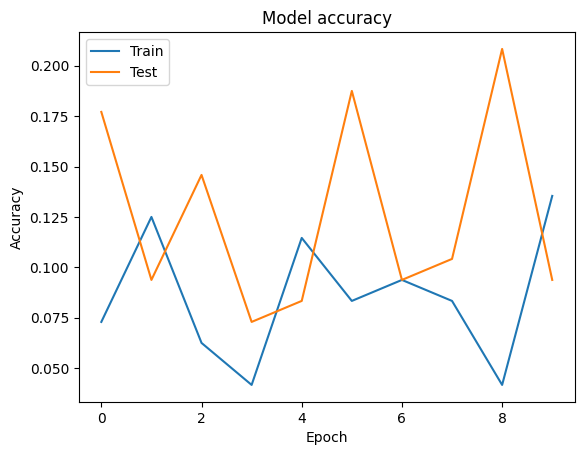

In [35]:
import matplotlib.pyplot as plt

def graph():
    #Plot training & validation accuracy values
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title('Model accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc='upper left')
    plt.show()

graph()

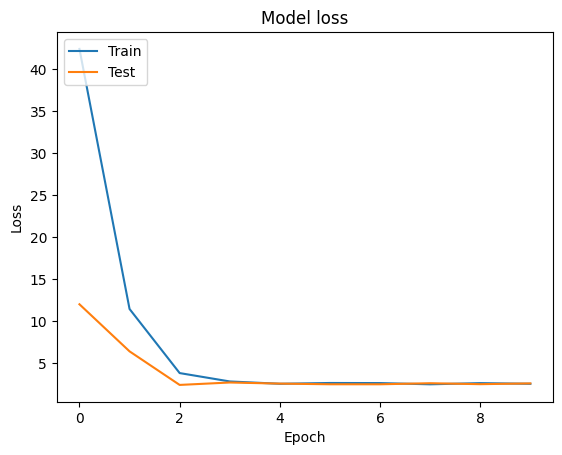

In [36]:
import matplotlib.pyplot as plt

def graph():
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc='upper left')
    plt.show()
graph()